In [14]:
import CalculatedFieldSubroutines as cfs

#

import numpy as np

import pandas as pd

#

import matplotlib.pyplot as plt

from pandasgui import show

import plotly.express as px

#

import warnings

In [15]:
warnings.filterwarnings( 'ignore' )

In [16]:
gmID_list = cfs.list_whitelisted_gmIDs()

In [17]:
topic_list = cfs.list_topics()

print( topic_list )

['/apollo/canbus/chassis', '/apollo/drive/event', '/apollo/sensor/gnss/best/pose', '/apollo/perception/traffic/light']


In [18]:
def ProgressAlongRoute_v2( time_sorted_best_pose_df, time_sorted_reference_best_pose_df = 'auto', num_of_partitions = 100, \
                           max_distance_coefficient = 5 ):

    if ( time_sorted_reference_best_pose_df == 'auto' ):

        if ( cfs.give_route( time_sorted_best_pose_df[ 'groupMetadataID' ][ 0 ] ) == 'Red' ):

            reference_best_pose_gmID = '9798fe24-f143-11ee-ba78-fb353e7798cd'

        elif ( cfs.give_route( time_sorted_best_pose_df[ 'groupMetadataID' ][ 0 ] ) == 'Green' ):

            reference_best_pose_gmID = '3a7dc9a6-f042-11ee-b974-fb353e7798cd'

        else:

            reference_best_pose_gmID = '3d2a80f0-ec81-11ee-b297-3b0ad9d5d6c6'
            
        time_sorted_reference_best_pose_df = cfs.retrieve_gmID_topic( gmID = reference_best_pose_gmID, 
                                                                      topic = '/apollo/sensor/gnss/best/pose' )

        time_sorted_reference_best_pose_df.sort_values( 'time' )

    reference_latitude_array = np.array( time_sorted_reference_best_pose_df[ 'latitude' ] )

    reference_longitude_array = np.array( time_sorted_reference_best_pose_df[ 'longitude' ] )

    reference_delta_latitude_array = np.diff( reference_latitude_array )

    reference_delta_longitude_array = np.diff( reference_longitude_array )

    reference_delta_distance_analog_array = np.sqrt( reference_delta_latitude_array ** 2 + reference_delta_longitude_array ** 2 )

    reference_ProgressAlongRoute_list = [ 0 ]

    for index, delta_distance_analog in enumerate( reference_delta_distance_analog_array ):

        running_delta_distance_analog = reference_ProgressAlongRoute_list[ index ] + delta_distance_analog

        reference_ProgressAlongRoute_list.append( running_delta_distance_analog )
    
    reference_ProgressAlongRoute_array = np.array( reference_ProgressAlongRoute_list )

    reference_ProgressAlongRoute_array = reference_ProgressAlongRoute_array / np.max( reference_ProgressAlongRoute_array )

    #

    partition_size = 1 / num_of_partitions

    reference_ProgressAlongRoute_partition_array = reference_ProgressAlongRoute_array // partition_size

    reference_ProgressAlongRoute_partition_array[ reference_ProgressAlongRoute_partition_array == \
                                                  num_of_partitions ] = num_of_partitions - 1

    #

    latitude_array = np.array( time_sorted_best_pose_df[ 'latitude' ] )

    longitude_array = np.array( time_sorted_best_pose_df[ 'longitude' ] )

    ProgressAlongRoute_list = []

    ProgressAlongRoute_partition_list = []
    #

    avg_reference_delta_distance_analog = np.median( reference_delta_distance_analog_array )

    max_distance_analog = avg_reference_delta_distance_analog * max_distance_coefficient

    #

    full_scan = True

    for index, ( latitude, longitude ) in enumerate( zip( latitude_array, longitude_array ) ):

        if ( full_scan == True ):

            distance_analog_array = np.sqrt( ( reference_latitude_array - latitude ) ** 2 + \
                                             ( reference_longitude_array - longitude ) ** 2 )

            min_distance_analog = np.min( distance_analog_array )

            if ( min_distance_analog > max_distance_analog ):

                ProgressAlongRoute_list.append( np.nan )

                ProgressAlongRoute_partition_list.append( np.nan )

                continue

            full_scan = False

            min_distance_analog_index = np.where( distance_analog_array == min_distance_analog )

            assigned_ProgressAlongRoute = reference_ProgressAlongRoute_array[ min_distance_analog_index ][ 0 ]

            assigned_ProgressAlongRoute_partition = reference_ProgressAlongRoute_partition_array[ min_distance_analog_index ][ 0 ]

        else:

            reference_subset_middle_parititon_num = ProgressAlongRoute_partition_list[ index - 1 ]

            reference_subset_lower_partition_num = reference_subset_middle_parititon_num - 1

            reference_subset_upper_partition_num = reference_subset_middle_parititon_num + 1

            if ( reference_subset_lower_partition_num < 0 ):

                reference_subset_lower_partition_num = num_of_partitions - 1

            if ( reference_subset_upper_partition_num > num_of_partitions - 1 ):

                reference_subset_upper_partition_num = 0

            reference_subset_indexes = np.where( ( reference_ProgressAlongRoute_partition_array == reference_subset_lower_partition_num ) | \
                                                 ( reference_ProgressAlongRoute_partition_array == reference_subset_middle_parititon_num ) | \
                                                 ( reference_ProgressAlongRoute_partition_array == reference_subset_upper_partition_num ) )

            reference_subset_latitude_array = reference_latitude_array[ reference_subset_indexes ]

            reference_subset_longitude_array = reference_longitude_array[ reference_subset_indexes ]

            subset_distance_analog_array = np.sqrt( ( reference_subset_latitude_array - latitude ) ** 2 + \
                                                    ( reference_subset_longitude_array - longitude ) ** 2 )

            min_subset_distance_analog = np.min( subset_distance_analog_array )

            if ( min_subset_distance_analog > max_distance_analog ):

                ProgressAlongRoute_list.append( np.nan )

                ProgressAlongRoute_partition_list.append( np.nan )

                full_scan = True

                continue

            min_subset_distance_analog_index = np.where( subset_distance_analog_array == min_subset_distance_analog )

            reference_subset_ProgressAlongRoute_array = reference_ProgressAlongRoute_array[ reference_subset_indexes ]

            reference_subset_ProgressAlongRoute_partition_array = reference_ProgressAlongRoute_partition_array[ reference_subset_indexes ]

            assigned_ProgressAlongRoute = reference_subset_ProgressAlongRoute_array[ min_subset_distance_analog_index ][ 0 ]

            assigned_ProgressAlongRoute_partition = reference_subset_ProgressAlongRoute_partition_array[ min_subset_distance_analog_index ][ 0 ]

        ProgressAlongRoute_list.append( assigned_ProgressAlongRoute )

        ProgressAlongRoute_partition_list.append( assigned_ProgressAlongRoute_partition )

    time_sorted_best_pose_df[ 'ProgressAlongRoute' ] = ProgressAlongRoute_list

    time_sorted_best_pose_df[ 'PartitionNumber' ] = ProgressAlongRoute_partition_list

    #

    if ( np.any( np.isnan( np.array( time_sorted_best_pose_df[ 'ProgressAlongRoute' ] ) ) ) == True ):

        return True

    else:

        return False

In [19]:
reference_red_route_best_pose_df = cfs.retrieve_gmID_topic( '9798fe24-f143-11ee-ba78-fb353e7798cd', '/apollo/sensor/gnss/best/pose' )

reference_green_route_best_pose_df = cfs.retrieve_gmID_topic( '3a7dc9a6-f042-11ee-b974-fb353e7798cd', '/apollo/sensor/gnss/best/pose' )

reference_blue_route_best_pose_df = cfs.retrieve_gmID_topic( '3d2a80f0-ec81-11ee-b297-3b0ad9d5d6c6', '/apollo/sensor/gnss/best/pose' )

In [20]:
red_route_best_pose_df_list1 = []

green_route_best_pose_df_list1 = []

blue_route_best_pose_df_list1 = []

for gmID in gmID_list:

    #

    current_gmID_best_pose_df = cfs.retrieve_gmID_topic( gmID, '/apollo/sensor/gnss/best/pose' )

    #

    current_gmID_best_pose_df = current_gmID_best_pose_df.sort_values( 'time' )

    #

    cfs.NormalizedTime( current_gmID_best_pose_df )

    #

    route = cfs.give_route( gmID )

    if ( route == 'Red' ):

        cfs.ProgressAlongRoute( current_gmID_best_pose_df, reference_red_route_best_pose_df )

    elif ( route == 'Green' ):

        cfs.ProgressAlongRoute( current_gmID_best_pose_df, reference_green_route_best_pose_df )

    else:

        cfs.ProgressAlongRoute( current_gmID_best_pose_df, reference_blue_route_best_pose_df )

    #

    if ( route == 'Red' ):

        red_route_best_pose_df_list1.append( current_gmID_best_pose_df )

    elif ( route == 'Green' ):

        green_route_best_pose_df_list1.append( current_gmID_best_pose_df )

    else:

        blue_route_best_pose_df_list1.append( current_gmID_best_pose_df )

In [21]:
red_route_best_pose_df_list2 = []

red_route_nan_best_pose_dfs = []

green_route_best_pose_df_list2 = []

green_route_nan_best_pose_dfs = []

blue_route_best_pose_df_list2 = []

blue_route_nan_best_pose_dfs = []

for gmID in gmID_list:

    #

    current_gmID_best_pose_df = cfs.retrieve_gmID_topic( gmID, '/apollo/sensor/gnss/best/pose' )

    #

    current_gmID_best_pose_df = current_gmID_best_pose_df.sort_values( 'time' )

    #

    cfs.NormalizedTime( current_gmID_best_pose_df )

    #

    nan = ProgressAlongRoute_v2( current_gmID_best_pose_df )

    #

    route = cfs.give_route( gmID )

    if ( route == 'Red' ):

        red_route_best_pose_df_list2.append( current_gmID_best_pose_df )

        if ( nan ):

            red_route_nan_best_pose_dfs.append( current_gmID_best_pose_df )

    elif ( route == 'Green' ):

        green_route_best_pose_df_list2.append( current_gmID_best_pose_df )

        if ( nan ):

            green_route_nan_best_pose_dfs.append( current_gmID_best_pose_df )

    else:

        blue_route_best_pose_df_list2.append( current_gmID_best_pose_df )

        if ( nan ):

            blue_route_nan_best_pose_dfs.append( current_gmID_best_pose_df )

In [22]:
print( len( red_route_nan_best_pose_dfs ) )

print( len( green_route_nan_best_pose_dfs ) )

print( len( blue_route_nan_best_pose_dfs ) )

12
0
4


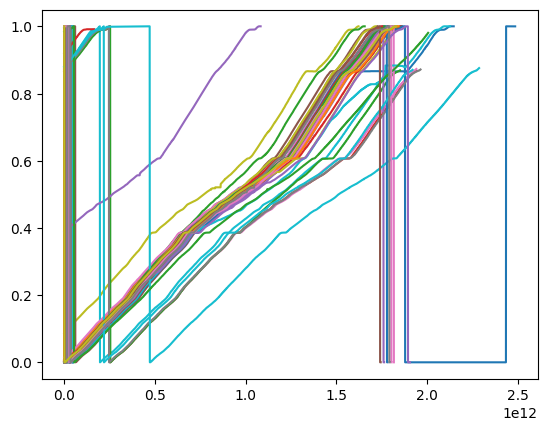

In [23]:
for best_pose_df in red_route_best_pose_df_list1:
    
    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

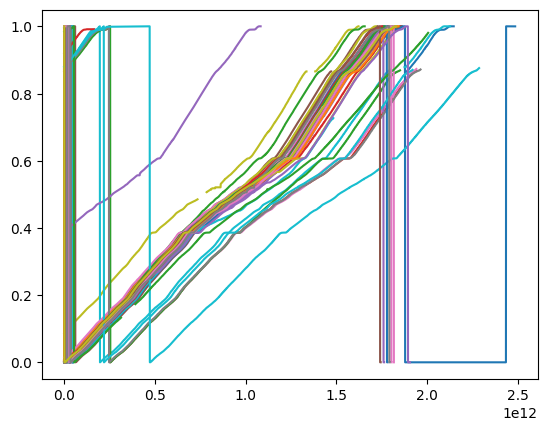

In [24]:
for best_pose_df in red_route_best_pose_df_list2:
    
    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

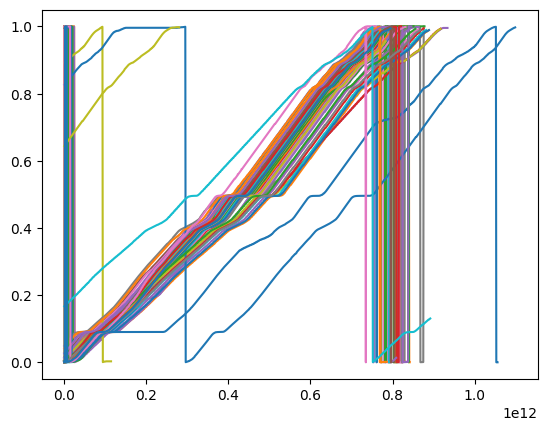

In [25]:
for best_pose_df in green_route_best_pose_df_list1:
    
    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

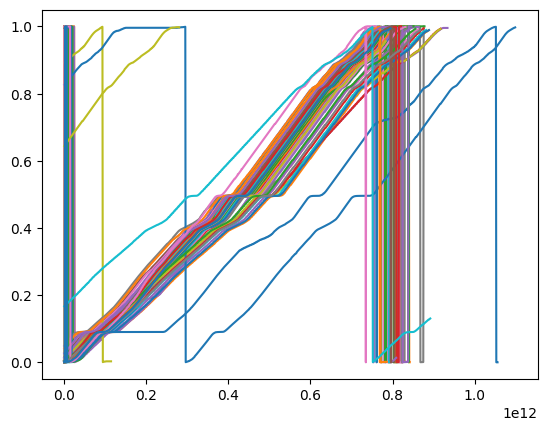

In [26]:
for best_pose_df in green_route_best_pose_df_list2:
    
    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

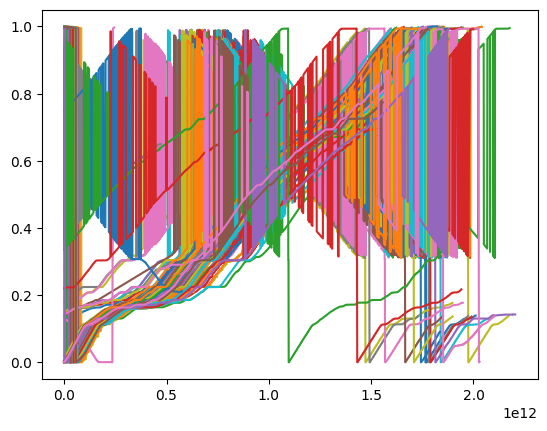

In [27]:
for best_pose_df in blue_route_best_pose_df_list1:
    
    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

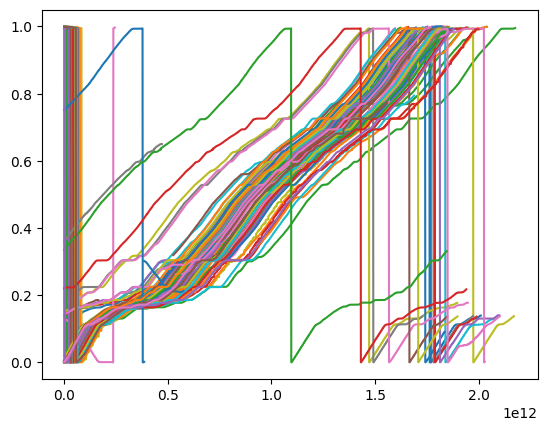

In [28]:
for best_pose_df in blue_route_best_pose_df_list2:
    
    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

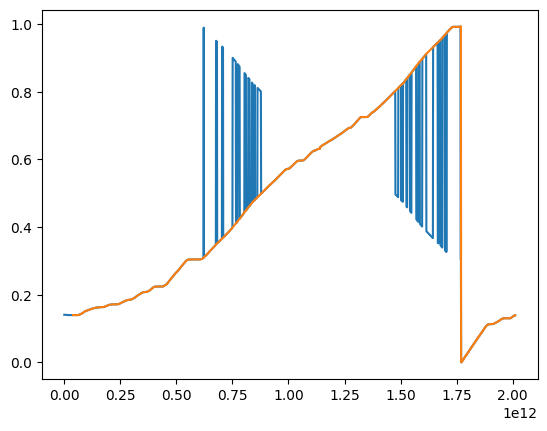

In [45]:
index = 0

plt.plot( blue_route_best_pose_df_list1[ index ][ 'NormalizedTime' ], blue_route_best_pose_df_list1[ index ][ 'ProgressAlongRoute' ] )

plt.plot( blue_route_best_pose_df_list2[ index ][ 'NormalizedTime' ], blue_route_best_pose_df_list2[ index ][ 'ProgressAlongRoute' ] )

plt.show()

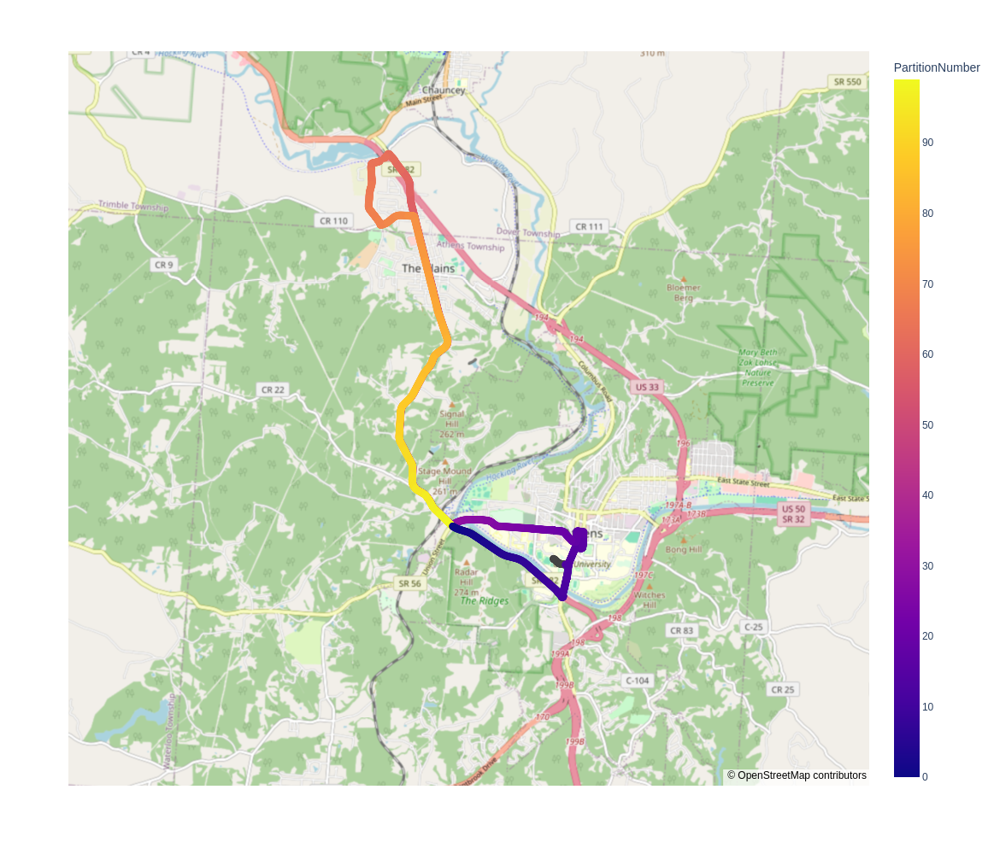

In [46]:
fig = px.scatter_mapbox(
                        blue_route_best_pose_df_list2[ index ], 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'PartitionNumber',
                        hover_data = [ 'ProgressAlongRoute', 'NormalizedTime' ],
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()

In [12]:
reference_red_route_best_pose_df_copy = reference_red_route_best_pose_df.copy()

cfs.NormalizedTime( reference_red_route_best_pose_df_copy )

ProgressAlongRoute_v2( reference_red_route_best_pose_df_copy )

concat_red_route_nan_best_pose_dfs = reference_red_route_best_pose_df_copy.copy()

for index, red_route_nan_best_pose_df in enumerate( red_route_nan_best_pose_dfs ):

    temp_df = red_route_nan_best_pose_df[ red_route_nan_best_pose_df[ 'ProgressAlongRoute' ].isnull() ]

    concat_red_route_nan_best_pose_dfs = pd.concat( [ concat_red_route_nan_best_pose_dfs, temp_df ] ) 

    print( index, red_route_nan_best_pose_df[ 'groupMetadataID' ][ 0 ] )

0 85b6e70e-ef7a-11ee-b966-fb353e7798cd
1 aa5dbcd2-ef10-11ee-9385-ef789ffde1d3
2 d3698592-ef9d-11ee-b966-fb353e7798cd
3 8347b862-efad-11ee-b966-fb353e7798cd
4 622bd2e8-f0e4-11ee-ba1f-fb353e7798cd
5 fd1ab258-efa7-11ee-b966-fb353e7798cd
6 219f7eb8-ef87-11ee-b966-fb353e7798cd
7 05c7c824-cab8-11ee-aa4d-1d66adf2f0c7
8 e7b934a8-ef1a-11ee-9385-ef789ffde1d3
9 3d2d29ec-ef95-11ee-b966-fb353e7798cd
10 7fb7b9c0-c881-11ee-a7fc-dd032dba19e8
11 fc211bb2-efca-11ee-b966-fb353e7798cd


In [12]:
fig = px.scatter_mapbox(
                        red_route_nan_best_pose_dfs[ 0 ], 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'PartitionNumber',
                        hover_data = [ 'ProgressAlongRoute' ],
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()

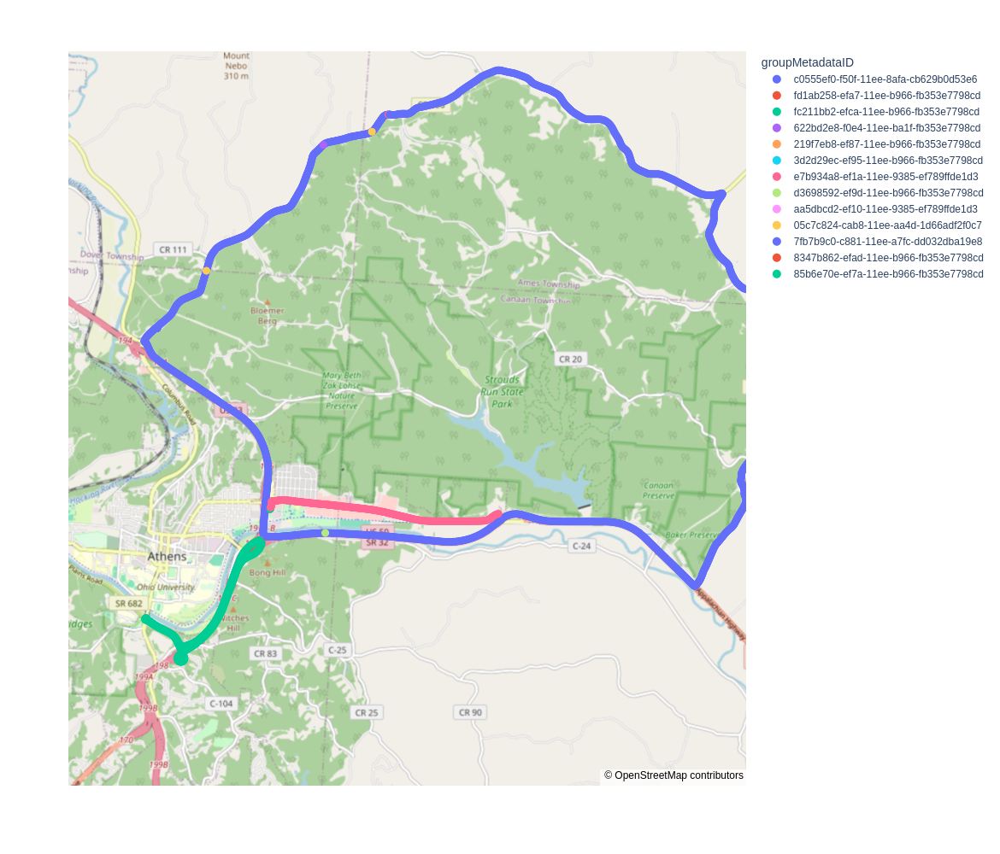

In [12]:
fig = px.scatter_mapbox(
                        concat_red_route_nan_best_pose_dfs, 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'groupMetadataID',
                        hover_data = [ 'ProgressAlongRoute' ],
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()

In [13]:
reference_blue_route_best_pose_df_copy = reference_blue_route_best_pose_df.copy()

cfs.NormalizedTime( reference_blue_route_best_pose_df_copy )

ProgressAlongRoute_v2( reference_blue_route_best_pose_df_copy, reference_blue_route_best_pose_df )

concat_blue_route_nan_best_pose_dfs = reference_blue_route_best_pose_df_copy.copy()

for index, blue_route_nan_best_pose_df in enumerate( blue_route_nan_best_pose_dfs ):

    temp_df = blue_route_nan_best_pose_df[ blue_route_nan_best_pose_df[ 'ProgressAlongRoute' ].isnull() ]

    concat_blue_route_nan_best_pose_dfs = pd.concat( [ concat_blue_route_nan_best_pose_dfs, temp_df ] ) 

    print( index, blue_route_nan_best_pose_df[ 'groupMetadataID' ][ 0 ] )

0 da853e0c-a10f-11ee-981c-d126ddbe9afa
1 154fab12-a43f-11ee-88ec-eb6a8d5269b4
2 286c70cc-d2f7-11ee-b437-336917683bb8
3 58263e34-a45c-11ee-88ec-eb6a8d5269b4
4 e8a8b2be-edbf-11ee-9385-ef789ffde1d3
5 64737d98-d312-11ee-b437-336917683bb8
6 ba6e1072-9524-11ee-956e-9da2d070324c


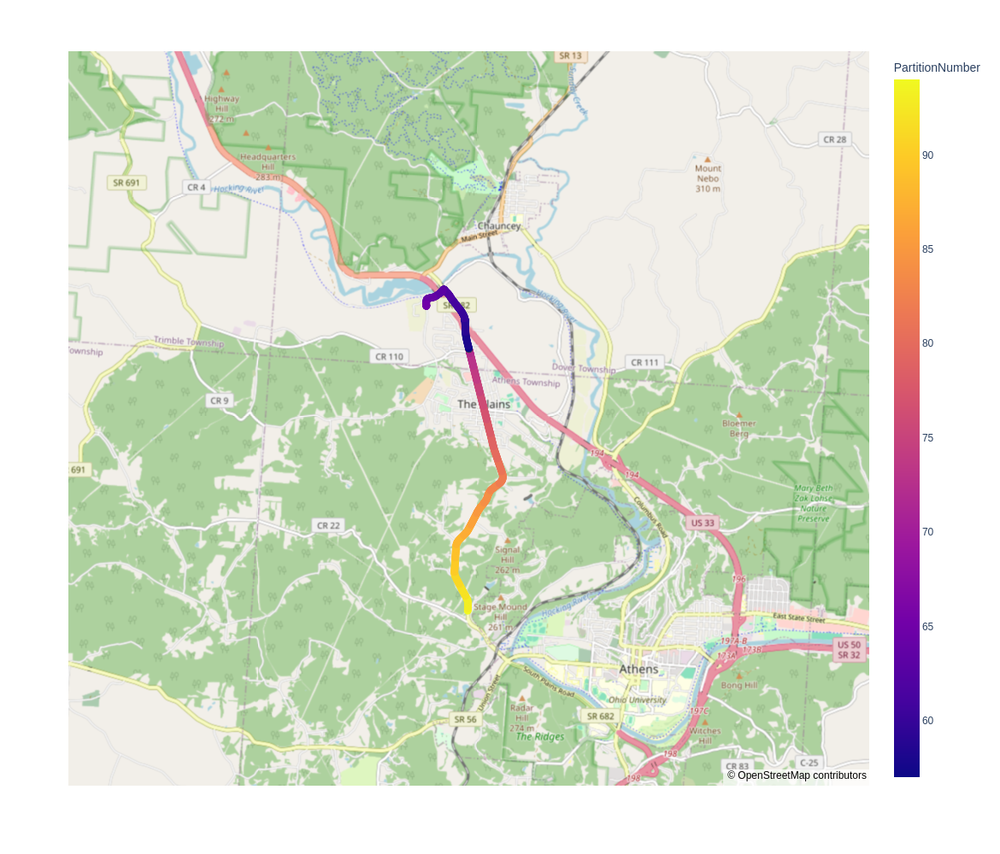

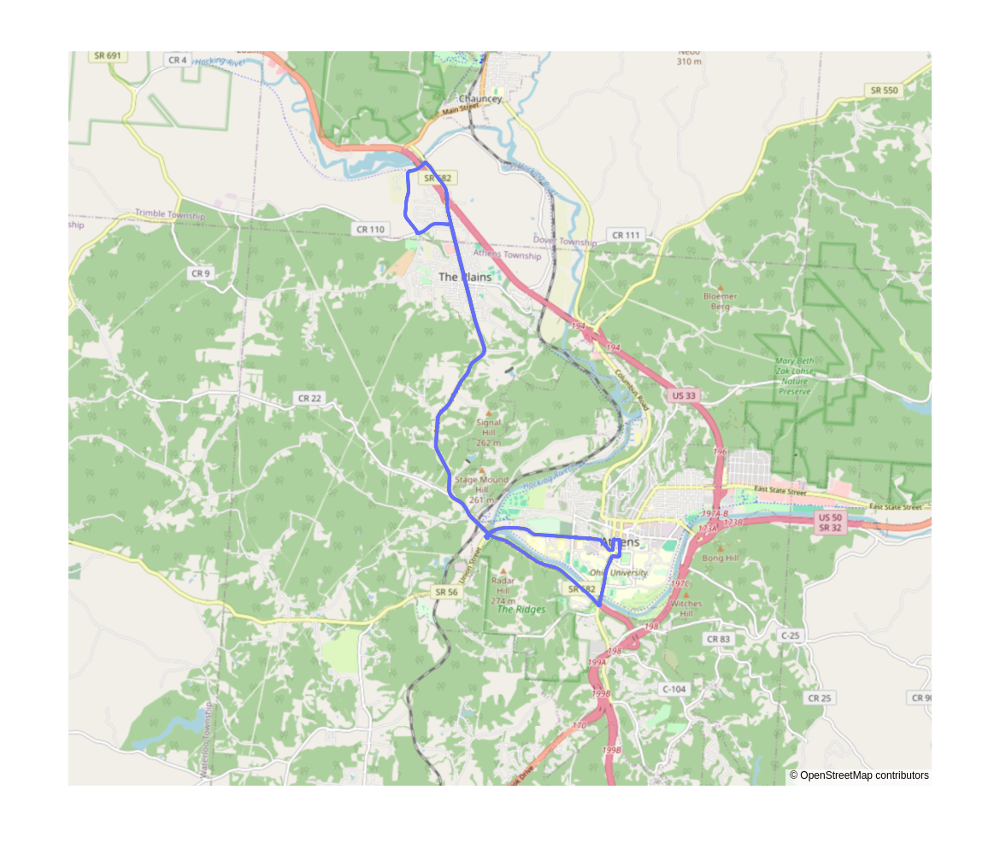

In [15]:
fig = px.scatter_mapbox(
                        blue_route_nan_best_pose_dfs[ 0 ], 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'PartitionNumber',
                        hover_data = [ 'ProgressAlongRoute', 'NormalizedTime' ],
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig2 = px.scatter_mapbox(
                        reference_blue_route_best_pose_df, 
                        lat = 'latitude', 
                        lon = 'longitude',
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig2.update_traces( marker = dict( size = 5 ) )

fig.show()

fig2.show()

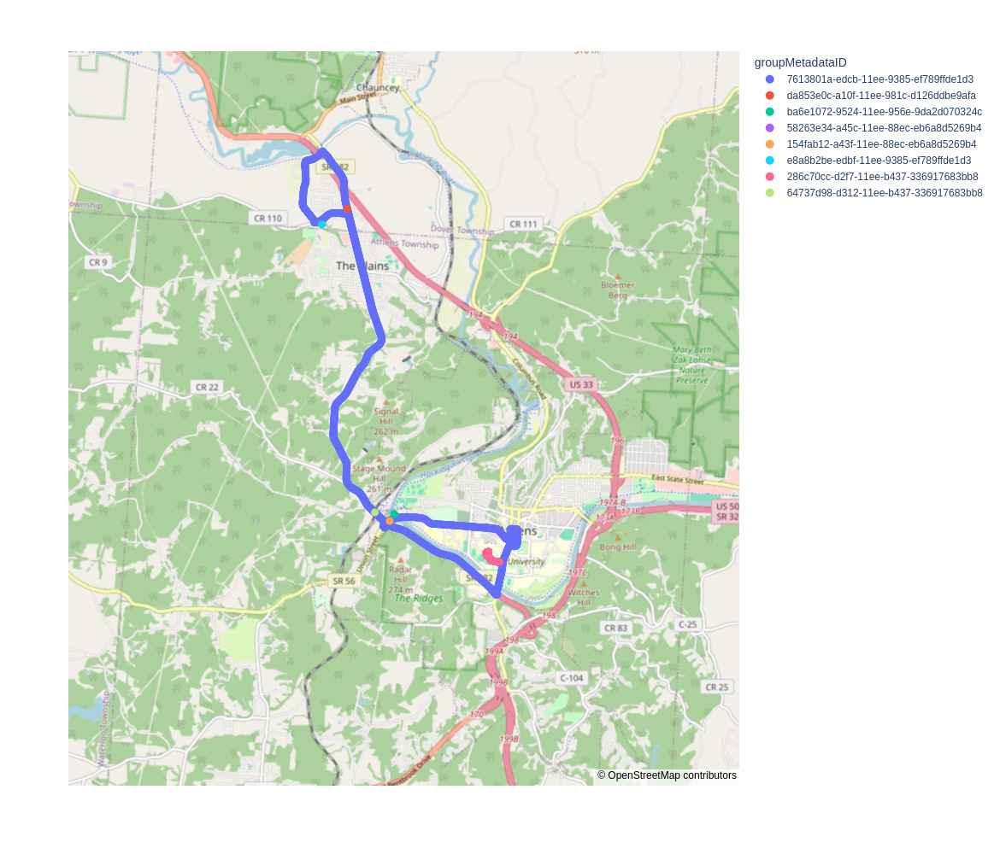

In [14]:
fig = px.scatter_mapbox(
                        concat_blue_route_nan_best_pose_dfs, 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'groupMetadataID',
                        hover_data = [ 'ProgressAlongRoute' ],
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()

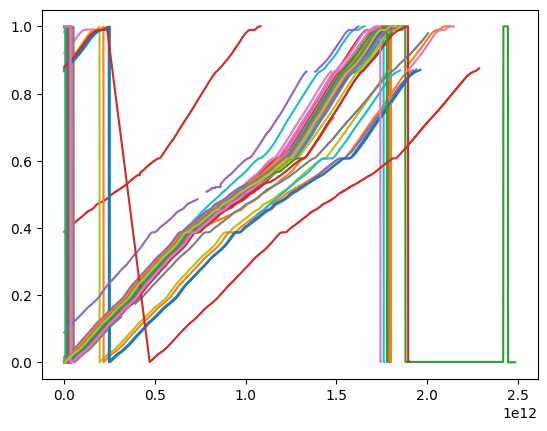

In [26]:
for best_pose_df in red_route_best_pose_df_list2:

    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

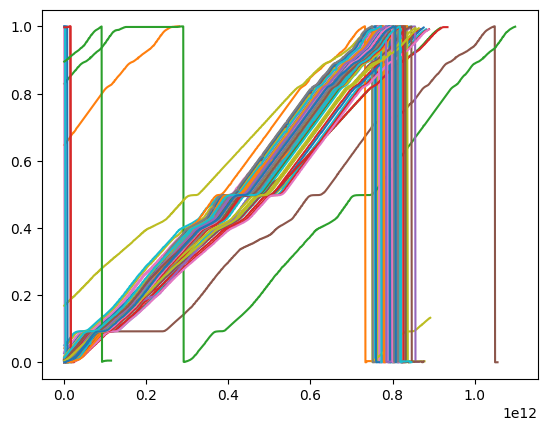

In [28]:
for best_pose_df in green_route_best_pose_df_list1:

    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

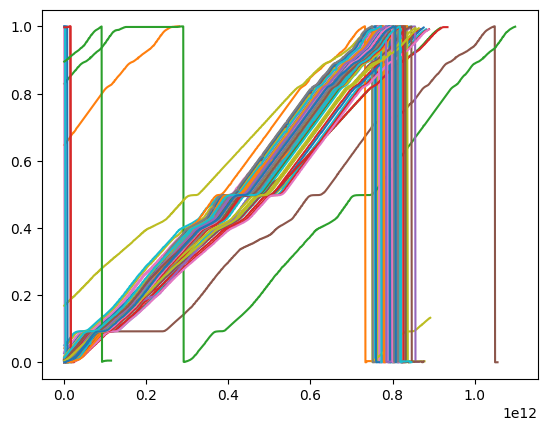

In [30]:
for best_pose_df in green_route_best_pose_df_list2:

    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

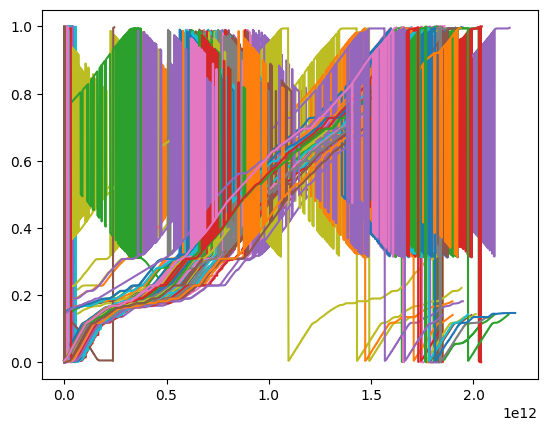

In [31]:
for best_pose_df in blue_route_best_pose_df_list1:

    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

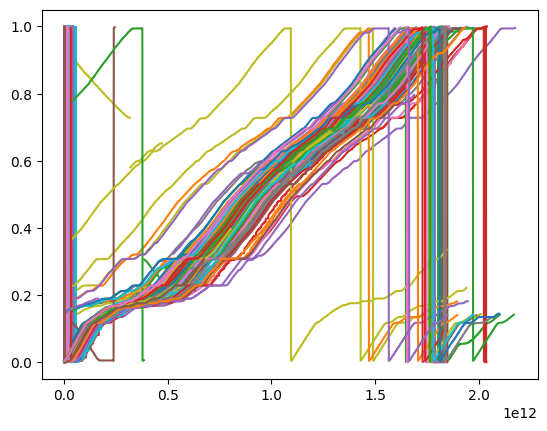

In [32]:
for best_pose_df in blue_route_best_pose_df_list2:

    plt.plot( best_pose_df[ 'NormalizedTime' ], best_pose_df[ 'ProgressAlongRoute' ] )

plt.show()

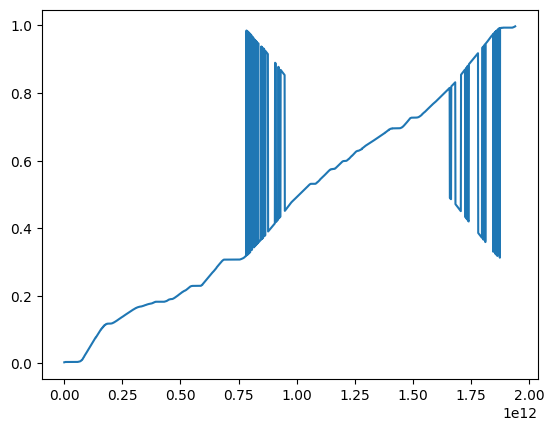

In [36]:
plt.plot( blue_route_best_pose_df_list1[ 50 ][ 'NormalizedTime' ], blue_route_best_pose_df_list1[ 50 ][ 'ProgressAlongRoute' ] )

plt.show()

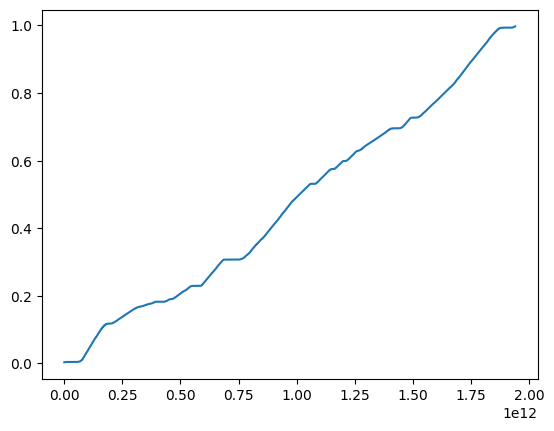

In [37]:
plt.plot( blue_route_best_pose_df_list2[ 50 ][ 'NormalizedTime' ], blue_route_best_pose_df_list2[ 50 ][ 'ProgressAlongRoute' ] )

plt.show()

In [34]:
len( blue_route_best_pose_df_list1 )

97

In [ ]:
############################

In [6]:
red_route_best_pose_df_list = []

green_route_best_pose_df_list = []

blue_route_best_pose_df_list = []

for gmID in gmID_list:

    current_gmID_best_pose_df = cfs.retrieve_gmID_topic( gmID, '/apollo/sensor/gnss/best/pose' )

    current_gmID_best_pose_df = current_gmID_best_pose_df.sort_values( 'time' )
    
    route = cfs.give_route( gmID )
    
    if ( route == 'Red' ):

        red_route_best_pose_df_list.append( current_gmID_best_pose_df )

    elif ( route == 'Green' ):

        green_route_best_pose_df_list.append( current_gmID_best_pose_df )

    else:

        blue_route_best_pose_df_list.append( current_gmID_best_pose_df )

In [7]:
gmID_ref_list = []

num_of_nan_dfs_list = []

for df_ref in red_route_best_pose_df_list:

    num_of_nan_dfs = 0

    for df in red_route_best_pose_df_list:

        if ( ProgressAlongRoute_v2( df, df_ref ) == True ):

            num_of_nan_dfs = num_of_nan_dfs + 1

    gmID_ref_list.append( df_ref[ 'groupMetadataID' ][ 0 ] )

    num_of_nan_dfs_list.append( num_of_nan_dfs )

gmID_ref_list = np.array( gmID_ref_list )

num_of_nan_dfs_list = np.array( num_of_nan_dfs_list )

In [9]:
min_num_of_nan_dfs = np.min( num_of_nan_dfs_list )

min_indexes = np.where( num_of_nan_dfs_list == min_num_of_nan_dfs )

gmIDs_with_min_num_nan_dfs_as_ref = gmID_ref_list[ min_indexes ]

In [13]:
gmIDs_with_min_num_nan_dfs_as_ref[ 0 ]

np.str_('9798fe24-f143-11ee-ba78-fb353e7798cd')

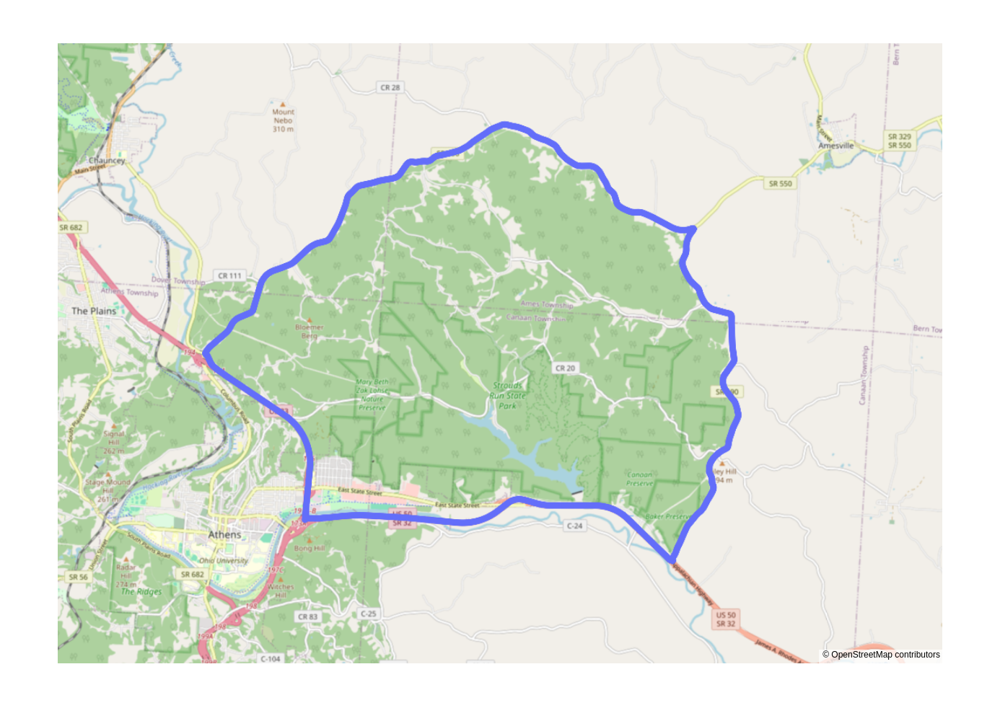

In [12]:
new_reference_red_route_best_pose_df = cfs.retrieve_gmID_topic( gmIDs_with_min_num_nan_dfs_as_ref[ 1 ], '/apollo/sensor/gnss/best/pose' )

fig = px.scatter_mapbox(
                        new_reference_red_route_best_pose_df, 
                        lat = 'latitude', 
                        lon = 'longitude',
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()

In [14]:
gmID_ref_list = []

num_of_nan_dfs_list = []

for df_ref in green_route_best_pose_df_list:

    num_of_nan_dfs = 0

    for df in green_route_best_pose_df_list:

        if ( ProgressAlongRoute_v2( df, df_ref ) == True ):

            num_of_nan_dfs = num_of_nan_dfs + 1

    gmID_ref_list.append( df_ref[ 'groupMetadataID' ][ 0 ] )

    num_of_nan_dfs_list.append( num_of_nan_dfs )

gmID_ref_list = np.array( gmID_ref_list )

num_of_nan_dfs_list = np.array( num_of_nan_dfs_list )

In [15]:
min_num_of_nan_dfs = np.min( num_of_nan_dfs_list )

min_indexes = np.where( num_of_nan_dfs_list == min_num_of_nan_dfs )

gmIDs_with_min_num_nan_dfs_as_ref = gmID_ref_list[ min_indexes ]

In [17]:
gmIDs_with_min_num_nan_dfs_as_ref[ 0 ]

np.str_('3a7dc9a6-f042-11ee-b974-fb353e7798cd')

In [18]:
min_num_of_nan_dfs

np.int64(0)

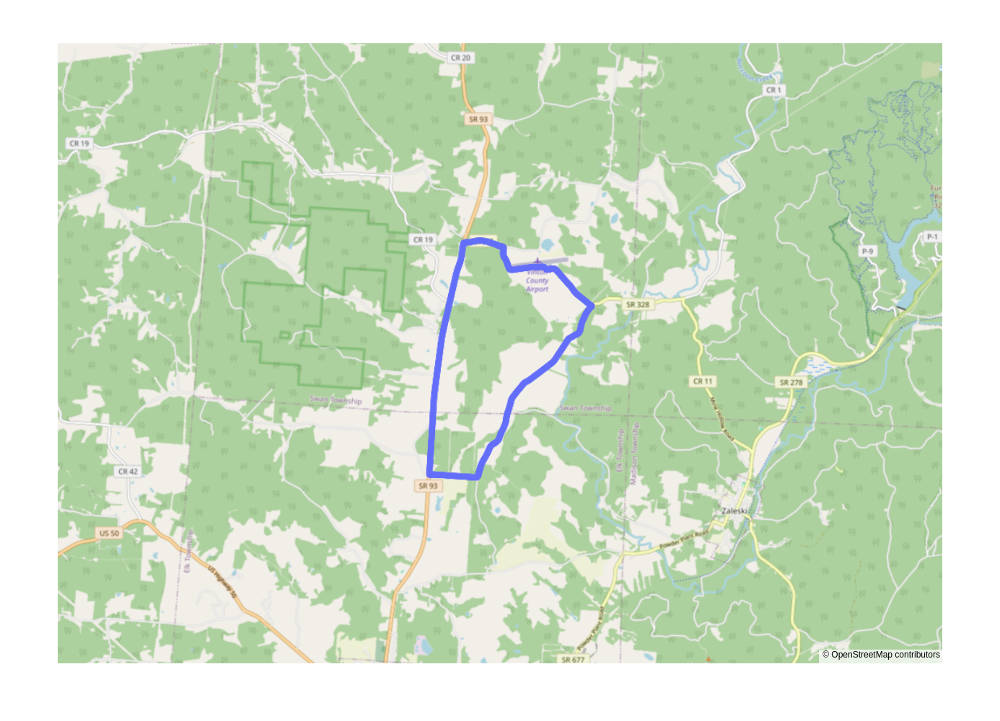

In [20]:
new_reference_green_route_best_pose_df = cfs.retrieve_gmID_topic( gmIDs_with_min_num_nan_dfs_as_ref[ 0 ], '/apollo/sensor/gnss/best/pose' )

fig = px.scatter_mapbox(
                        new_reference_green_route_best_pose_df, 
                        lat = 'latitude', 
                        lon = 'longitude',
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()

In [21]:
gmID_ref_list = []

num_of_nan_dfs_list = []

for df_ref in blue_route_best_pose_df_list:

    num_of_nan_dfs = 0

    for df in blue_route_best_pose_df_list:

        if ( ProgressAlongRoute_v2( df, df_ref ) == True ):

            num_of_nan_dfs = num_of_nan_dfs + 1

    gmID_ref_list.append( df_ref[ 'groupMetadataID' ][ 0 ] )

    num_of_nan_dfs_list.append( num_of_nan_dfs )

gmID_ref_list = np.array( gmID_ref_list )

num_of_nan_dfs_list = np.array( num_of_nan_dfs_list )

In [22]:
min_num_of_nan_dfs = np.min( num_of_nan_dfs_list )

min_indexes = np.where( num_of_nan_dfs_list == min_num_of_nan_dfs )

gmIDs_with_min_num_nan_dfs_as_ref = gmID_ref_list[ min_indexes ]

In [23]:
min_num_of_nan_dfs

np.int64(4)

In [24]:
gmIDs_with_min_num_nan_dfs_as_ref

array(['3441fc36-ecca-11ee-b297-3b0ad9d5d6c6',
       '3d2a80f0-ec81-11ee-b297-3b0ad9d5d6c6'], dtype='<U36')

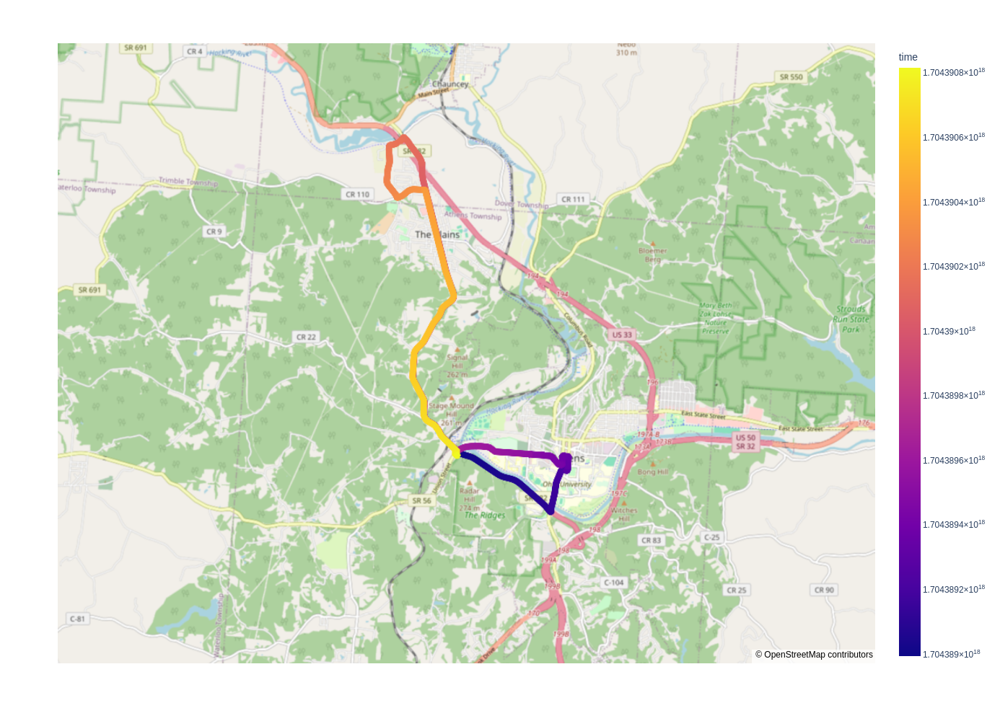

In [30]:
new_reference_green_route_best_pose_df = cfs.retrieve_gmID_topic( gmIDs_with_min_num_nan_dfs_as_ref[ 1 ], '/apollo/sensor/gnss/best/pose' )

fig = px.scatter_mapbox(
                        new_reference_green_route_best_pose_df, 
                        lat = 'latitude', 
                        lon = 'longitude',
                        color = 'time',
                        opacity = 1,
                        zoom = 12, 
                        height = 1000, 
                        mapbox_style = 'open-street-map'
                       )

fig.update_traces( marker = dict( size = 10 ) )

fig.show()